In [1]:
import matplotlib.pyplot as Plt
%matplotlib inline
from src.calibration import Calibration
from src.visualizer import Visualizer
from src.camera import Camera
import pickle
import cv2
import glob

In [2]:
calibration_data = pickle.load(open("calibration_data.p", "rb" ))
calibration_data

{'camera_matrix': array([[1.15777818e+03, 0.00000000e+00, 6.67113856e+02],
        [0.00000000e+00, 1.15282217e+03, 3.86124584e+02],
        [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]]),
 'distortion_coefficient': array([[-0.24688507, -0.02373153, -0.00109831,  0.00035107, -0.00259872]])}

In [3]:
car_points = [(585, 460), (203, 720), (1127, 720), (695, 460)]
bird_points = [(320, 0), (320, 720), (960, 720), (960, 0)]
prespective_data = {'car_points': car_points, 'bird_points': bird_points}
pickle.dump(prespective_data, open("prespective_data.p", "wb"))

In [4]:
camera = Camera(calibration_data, car_points, bird_points)
visualizer = Visualizer()

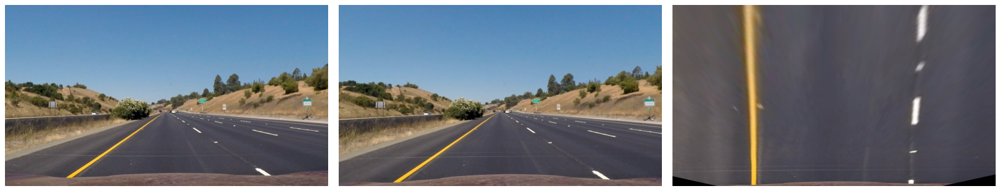

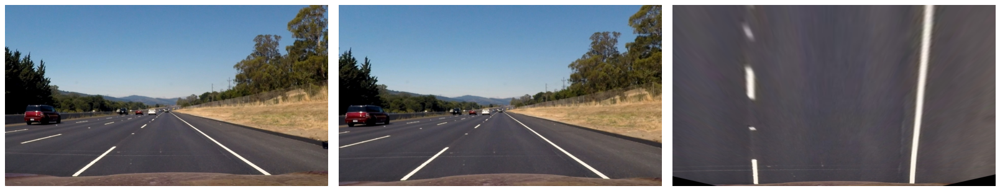

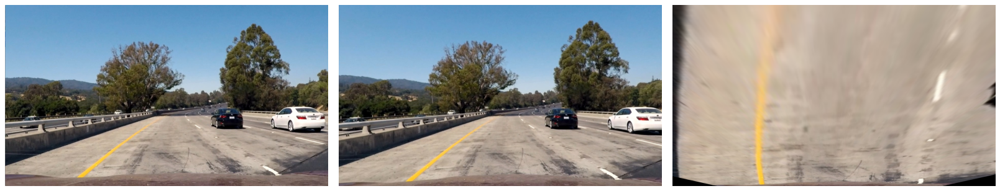

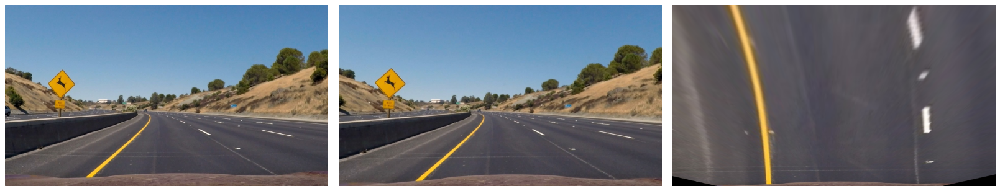

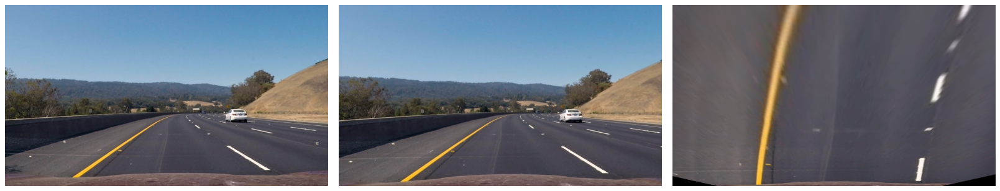

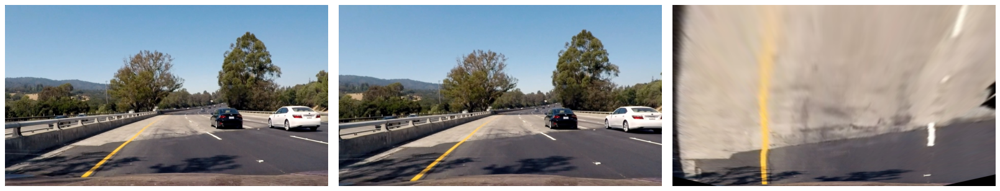

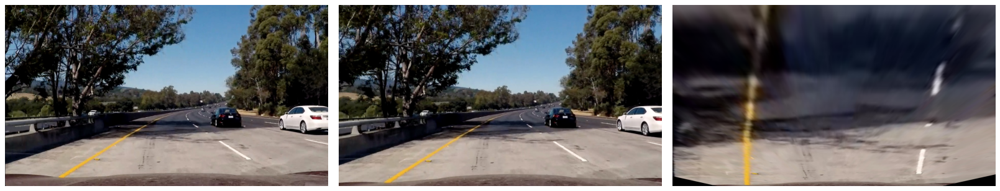

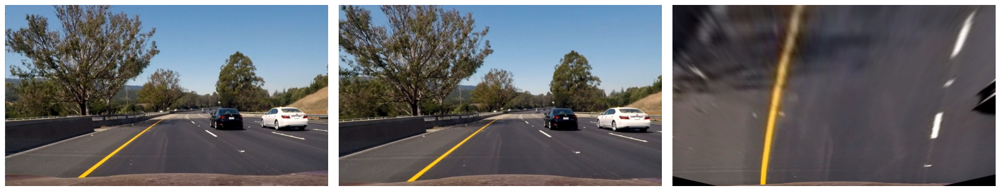

In [5]:
images_path = glob.glob('../test_images/*.jpg')
images_to_save = []
images_name_to_save = []
for image_path in images_path:
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    undist = camera.get_undistort_image(image)
    bird_image = camera.get_bird_view(undist)

    images_to_save.append(bird_image)
    images_name_to_save.append(os.path.basename(image_path))

    visualizer.show_images([image, undist, bird_image], per_row=3, per_col = 1, W = 20, H = 20)
visualizer.save_images('prespective', images_to_save, images_name_to_save)